In [1]:
import cv2
import numpy as np
import onnxruntime as ort
import matplotlib.pyplot as plt


class McDDetector:
    def __init__(self, onnx_model, input_shape=(640,640), confidence_thres=0.35,
                 iou_thres=0.65, providers=["CUDAExecutionProvider", "CPUExecutionProvider"]):
        self.onnx_model = onnx_model
        self.input_width, self.input_height = input_shape
        self.input_shape = input_shape
        self.conf_threshold = confidence_thres
        self.iou_threshold = iou_thres

        # Create an inference session using the ONNX model and specify execution providers
        self.session = ort.InferenceSession(self.onnx_model, providers=providers)
        self.input_names = self.session.get_inputs()
        self.output_names = self.session.get_outputs()

    def _preprocess(self, image, letter_box=True):
        if letter_box:
            self.img_h, self.img_w, _ = image.shape
            new_h, new_w = self.input_shape
            offset_h, offset_w = 0, 0

            if (new_w / self.img_w) <= (new_h / self.img_h):
                new_h = int(self.img_h * new_w / self.img_w)
                offset_h = (self.input_shape[0] - new_h) // 2
            else:
                new_w = int(self.img_w * new_h / self.img_h)
                offset_w = (self.input_shape[1] - new_w) // 2

            resized = cv2.resize(image, (new_w, new_h))
            img = np.full((self.input_shape[0], self.input_shape[1], 3),
                          127, dtype=np.uint8)
            img[offset_h:(offset_h+new_h), offset_w:(offset_w+new_w), :] = resized # Middle.
        else:
            img = cv2.resize(image, (self.input_shape[1], self.input_shape[0]))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img.transpose((2, 0, 1)).astype(np.float32)
        img /= 255.0
        
        input_image_buffer = np.expand_dims(img, axis=0)
        return input_image_buffer

    def _postprocess(self, results, letter_box=True):
##        num_dets = results.as_numpy(OUTPUT_NAMES[0])[0]
        num_dets = results[0]
        num_dets = num_dets[num_dets[:, 5] == 0.0]
        num_dets = num_dets[num_dets[:, 4] >= 0.30]
        boxes = num_dets[:, :4]
        boxes = num_dets[:, :4] / np.array([self.input_shape[1],
                                            self.input_shape[0],
                                            self.input_shape[1],
                                            self.input_shape[0]], dtype=np.float32)
        scores = num_dets[:, 4]
        classes = num_dets[:, 5].astype(np.int64)

        old_h, old_w = self.img_h, self.img_w
        offset_h, offset_w = 0, 0
        # Remove, it doesn't work properly.
        if letter_box:
            if (self.img_w / self.input_shape[1]) >= (self.img_h / self.input_shape[0]):
                old_h = int(self.input_shape[0] * self.img_w / self.input_shape[1])
                offset_h = (old_h - self.img_h) // 2
            else:
                old_w = int(self.input_shape[1] * self.img_h / self.input_shape[0])
                offset_w = (old_w - self.img_w) // 2

        boxes = boxes * np.array([old_w, old_h, old_w, old_h], dtype=np.float32)
        if letter_box:
            boxes -= np.array([offset_w, offset_h, offset_w, offset_h], dtype=np.float32)
            boxes = np.clip(boxes, 0, max(self.img_w, self.img_h))
    
        return np.hstack((boxes, scores[:, None], classes[:, None]))

    def inference(self, img):
        out = self.session.run(None,
                               {self.input_names[0].name: self._preprocess(img)})

        return self._postprocess(out[0])
    
# if __name__ == "__main__":
    
#     onnx_model = "yolo.onnx"  # Fixed filename format
#     mcd_obj = McDDetector(onnx_model)

#     images =  "result.jpg" 

#     img = cv2.imread(images)
#     if img is None:
#         print("Error: Could not read image.")
#         exit()

#     dets = mcd_obj.inference(img)

#     for *xyxy, score, label in dets:
#         if score < 0.50:
#             continue
        
#         box = list(map(int, xyxy))
#         color = (255, 0, 0)
#         cv2.rectangle(img, box[:2], box[2:], color, 3)

#     cv2.imshow("Detected Objects", img)  # Added window name
#     cv2.waitKey(0)  # Allows the window to stay open until a key is pressed
#     cv2.destroyAllWindows()  # Closes the window properly

In [2]:
import cv2
import onnx
import onnxruntime as ort
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy
import time
import os

# Class names for classification
class_names = np.array([
    'BigSpicy Mcwrap Chicken', 'Chicken McNuggets', 'Crispy Veggie Burger',
    'Fish Fillet', 'Hot cakes', 'Maharaja Mac Chicken',
    'Mc Cheese Burger Chicken', 'McCheese Burger Veg',
    'McCrispy Chicken Burger', 'McSpicy Paneer', 'Mcflurry Small',
    'Mcspicy chicken', 'Medium French Fries', 'cold drink',
    'corn cheese veg burger', 'dosa bun', 'maharaja mac veg',
    'mcaloo tickki burger', 'mcspicy premium veg burger', 'mcveggie',
    'mcwrap paneer', 'small french fries', 'spinach corn'
])
num_classes = len(class_names)

# Image preprocessor for classifier
def preprocess_for_classification(img, size=(224, 224)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, size)
    img = img.astype(np.float32)
    return img

# Load ONNX classifier model
onnx_model_path = "mobilenetv3small_finetune.onnx"
onnx_model = onnx.load(onnx_model_path)
onnx.checker.check_model(onnx_model)
ort_session = ort.InferenceSession(onnx_model_path)

# Function to run classifier
def classify_object(cropped_img):
    input_img = preprocess_for_classification(cropped_img)
    input_tensor = np.expand_dims(input_img, axis=0)
    outputs = ort_session.run(None, {"input": input_tensor})
    pred_index = np.argmax(outputs[0][0])
    return class_names[pred_index]


/Users/saptarshimallikthakur/Desktop/tracking/.venv/lib/python3.10/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:118: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Loaded Images/ss1.png


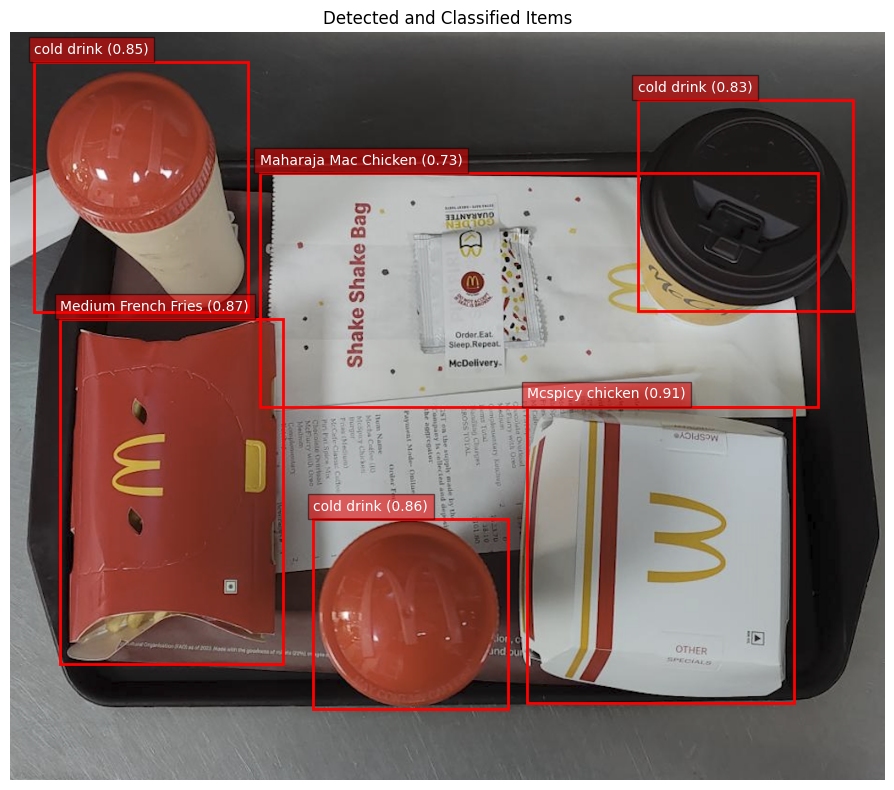

Loaded Images/ss2.png


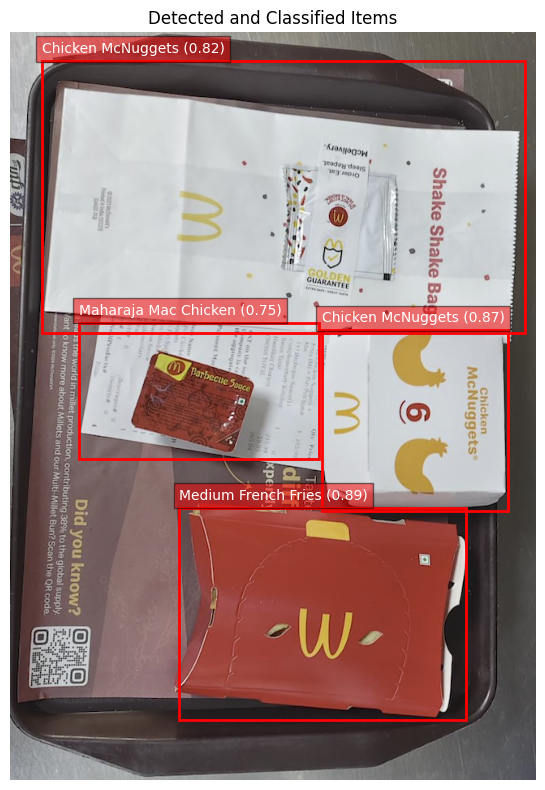

Loaded Images/ss3.png


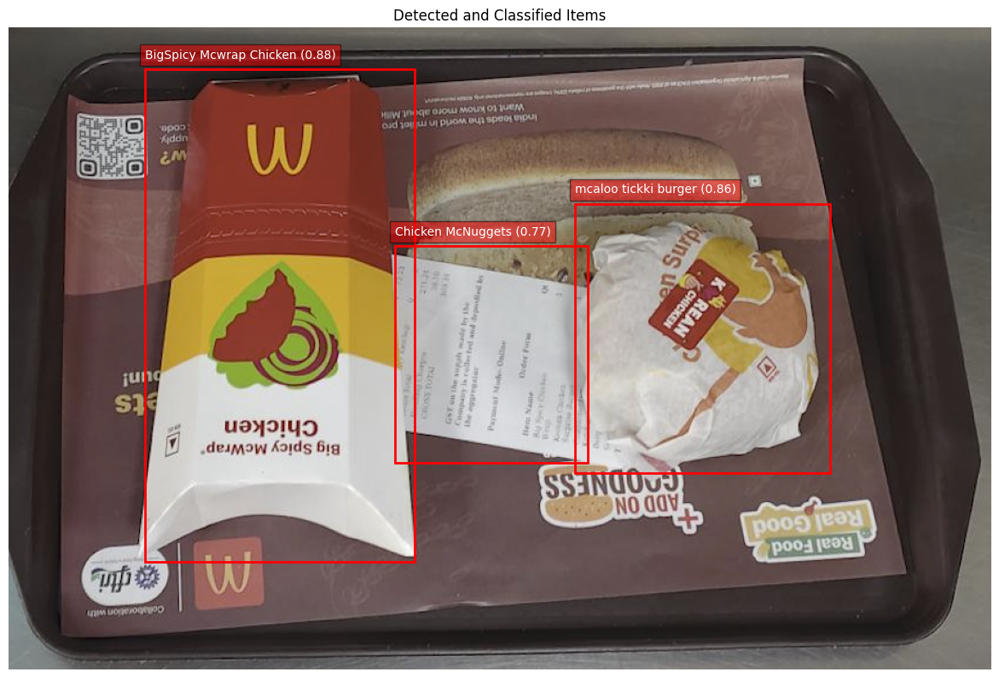

Loaded Images/ss4.png


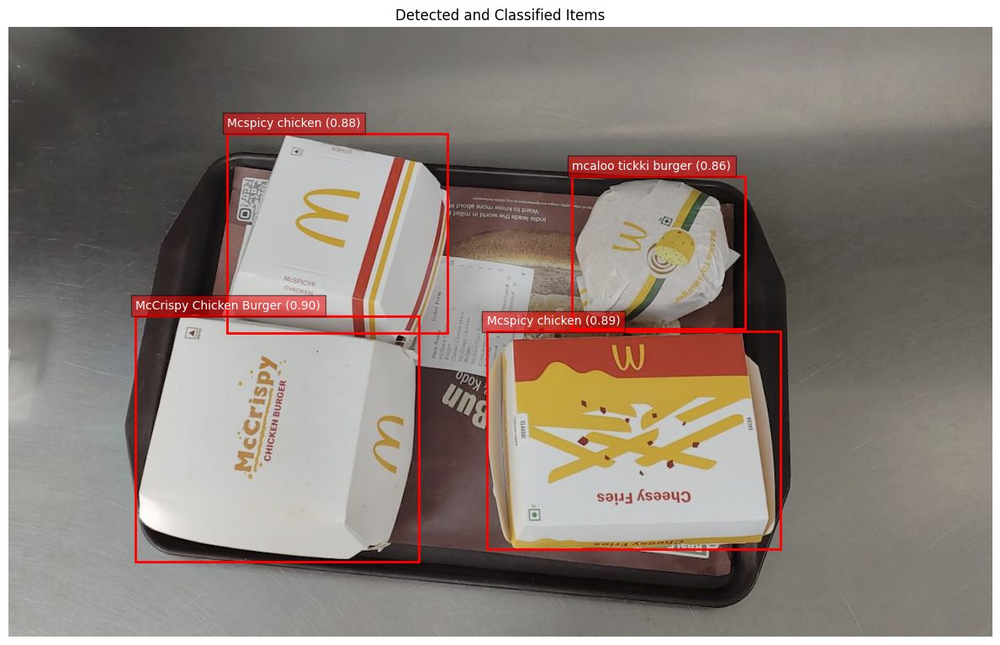

Loaded Images/ss5.png


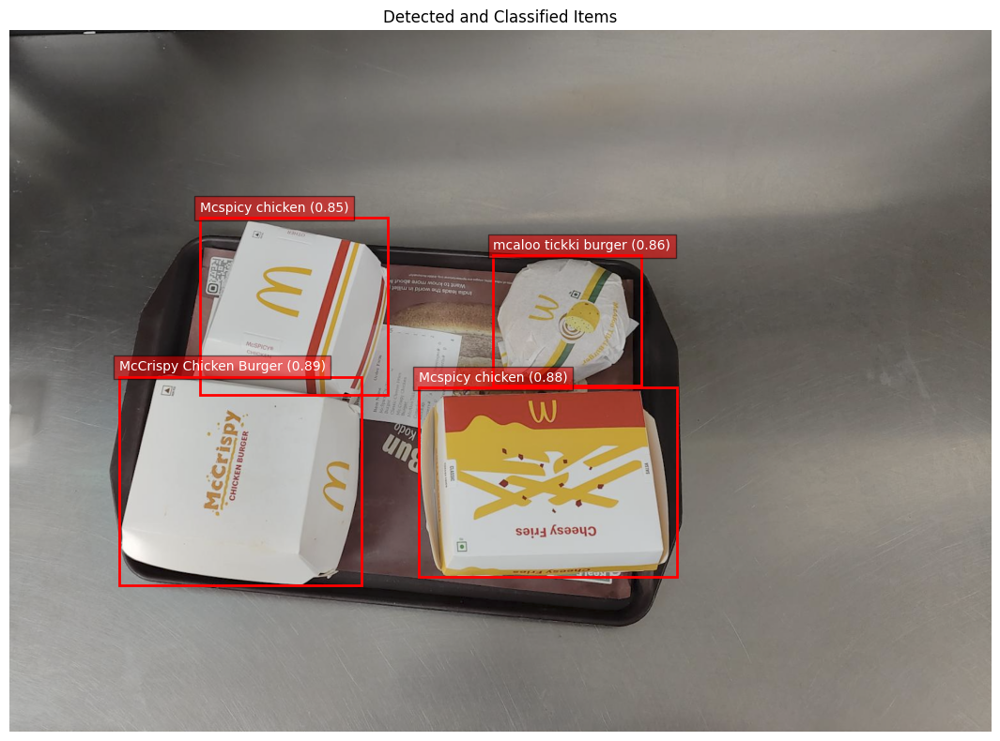

Loaded Images/ss6.png


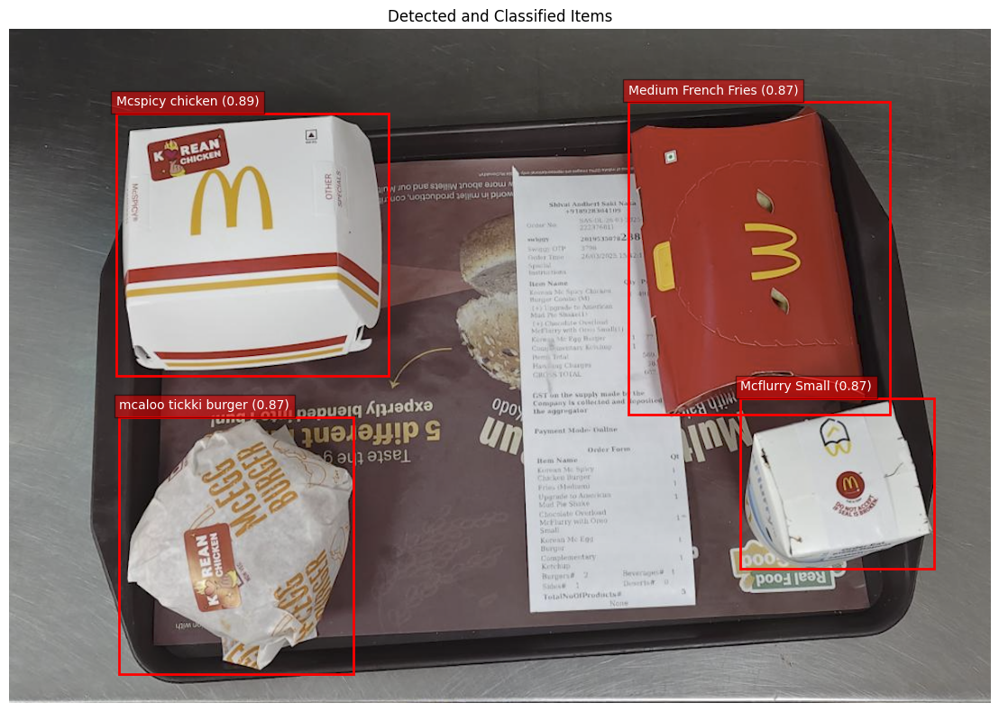

Loaded Images/ss7.png


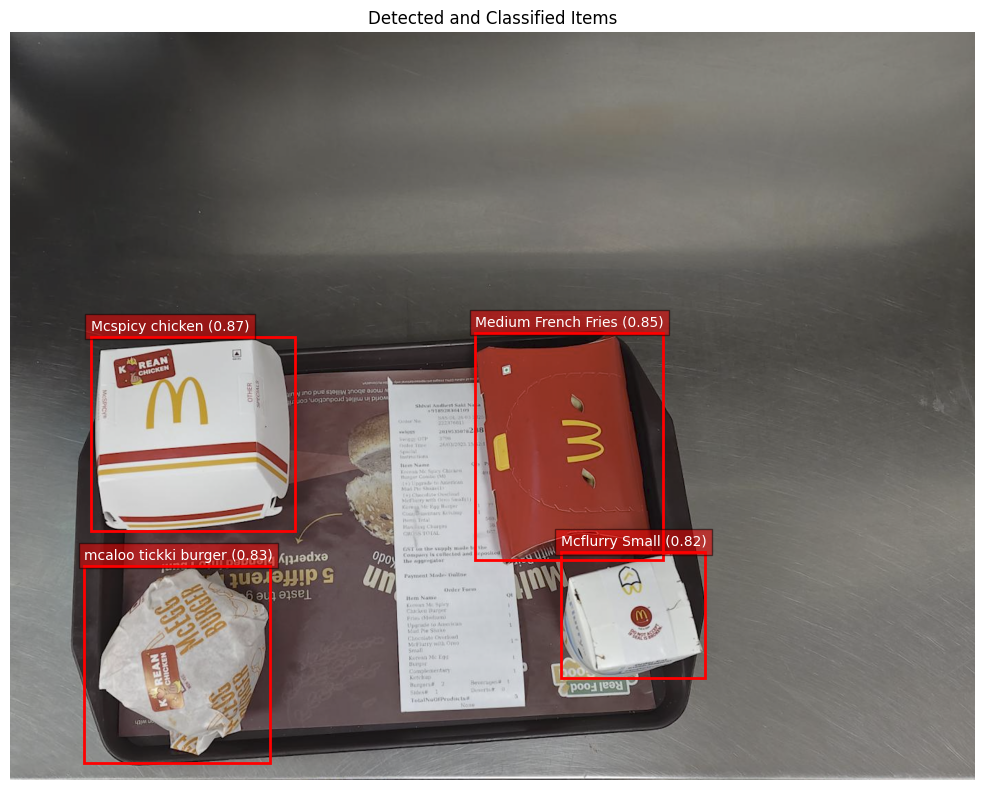

Loaded Images/ss8.png


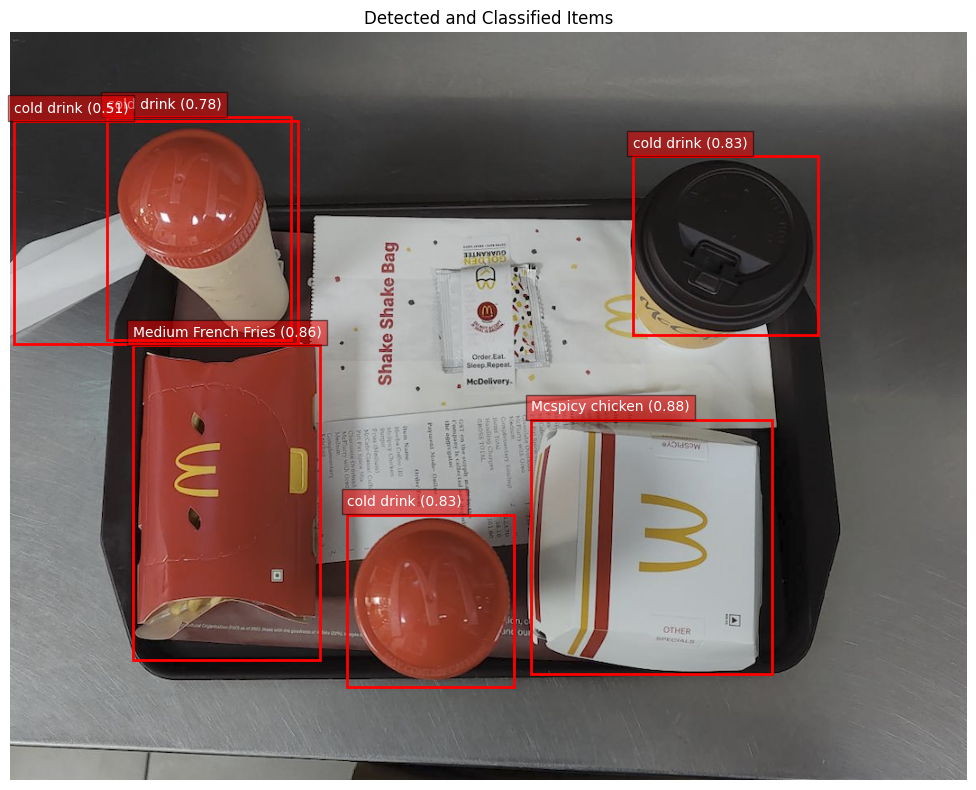

Loaded Images/ss9.png


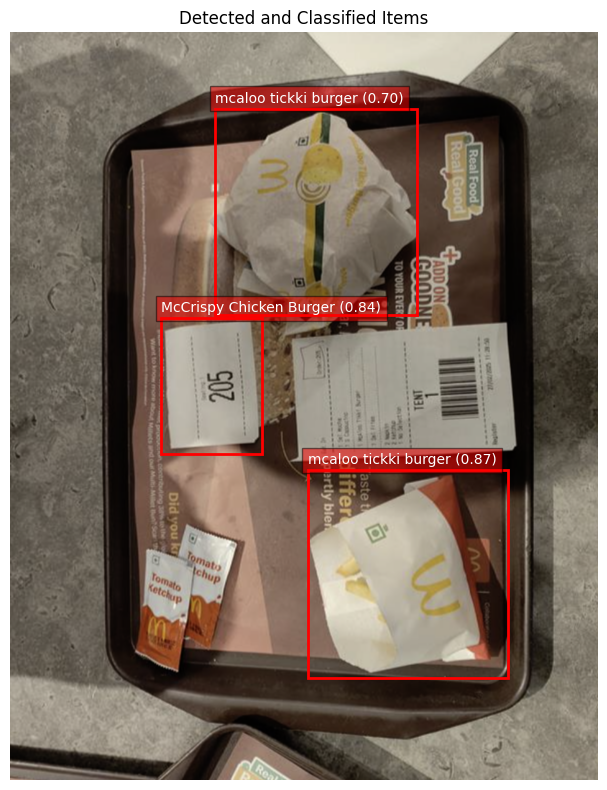

Loaded Images/ss10.jpg


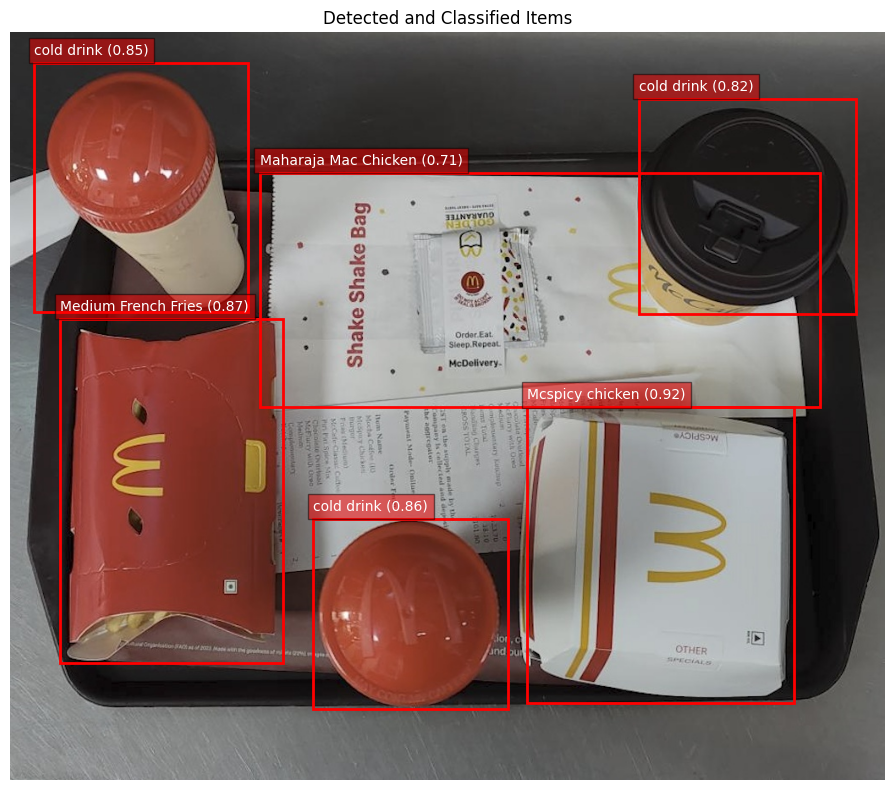

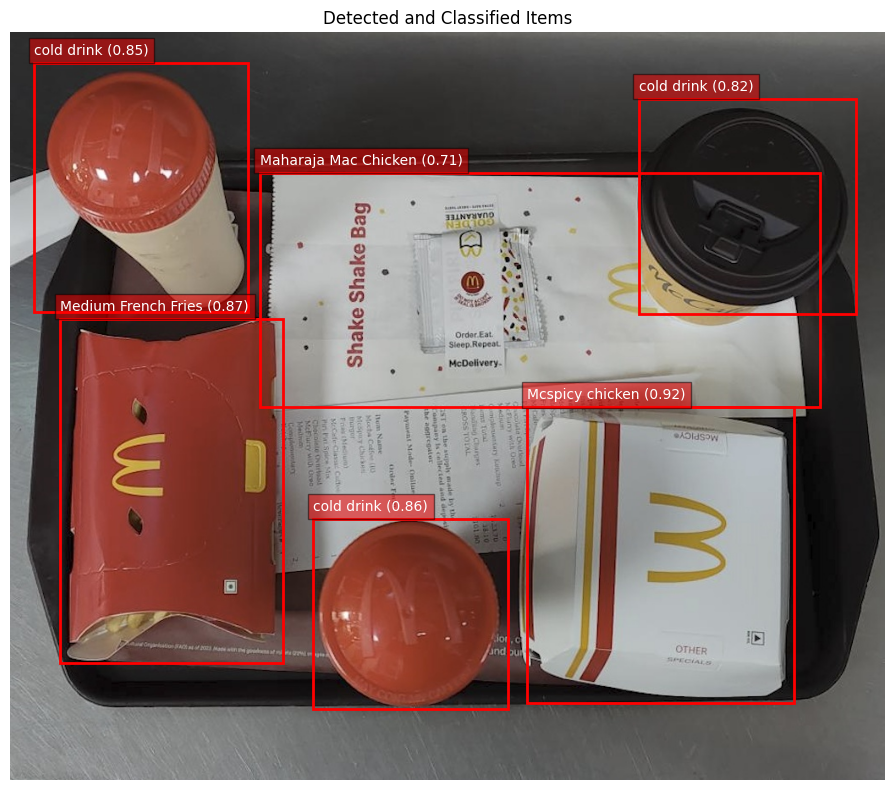

4.0524070262908936


In [3]:
# --- Detection + Classification Pipeline ---
start = time.time()

for i in range(1,12):
    # Load Detection Model
    onnx_yolo_model = "yolo.onnx"
    mcd_obj = McDDetector(onnx_yolo_model)

    # Input Image (checking for available extensions)
    for ext in ['.png', '.jpg', '.jpeg']:
        image_path = f'Images/ss{i}{ext}'
        
        if os.path.exists(image_path):  # Check if the file exists
            img = cv2.imread(image_path)
            
            if img is not None:
                # Process the image (or add your logic here)
                print(f'Loaded {image_path}')

    # Run Detection
    detections = mcd_obj.inference(img)

    # Plotting setup
    img_rgb = cv2.cvtColor(deepcopy(img), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8))
    plt.imshow(img_rgb)
    ax = plt.gca()

    for *xyxy, score, label in detections:
        if score < 0.50:
            continue

        x1, y1, x2, y2 = map(int, xyxy)
        cropped = img[y1:y2, x1:x2]
        predicted_label = classify_object(cropped)

        # Draw bounding box and label
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                             linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 10, f'{predicted_label} ({score:.2f})',
                color='white', fontsize=10, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.title("Detected and Classified Items")
    plt.tight_layout()
    plt.show()

end = time.time()

print(end-start)